# Import libraries

Pandas will be used to to work with the DataFrames. Matplotlib and seaborn are libraries that allows us plot charts and graphics.

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


We open an csv file, with a determined Cryptocurrency historical data edited, with a determined sequence (ten previous candles and ten subsequent). Also have the technical indicators.
In this case, we'll use ADAUSDT, downloaded with **call_bina.py** as follows:

**call_bina.py ADAUSDT base 2021 2 2 30m**

It means, ADAUSDT Cryptocurrency historical data, since 2021 february 2nd with a interval of 30m

In [272]:
file = pd.read_csv(f"analysis/analysis_2022-07-06_16_42.csv")


In [273]:
file.head()

,Unnamed: 0,volume_0,mart_0,mart_inv_0,ampl_2_0,rsi_0,macd_0,macd_h0,macd_s0,volume_1,...,macd_10,macd_h10,macd_s10,date,slope_prev,slope_prev_short,slope_next_short,high,low,close
0,0,1.067848,-0.025592,0.024732,1.034788,76.558751,0.025677,0.002035,0.023642,0.782629,...,0.021514,0.001826,0.019688,2021-02-10 10:30:00,0.001138,0.004532,-0.002399,0.066771,-0.098134,0.003367
1,1,2.235850,-0.011127,0.010665,1.043264,78.133813,0.027176,0.002828,0.024349,1.061254,...,0.021306,0.001294,0.020011,2021-02-10 11:00:00,0.001142,0.004949,-0.003780,0.056198,-0.107072,-0.006920
2,2,2.617429,-0.033355,0.031492,1.059183,82.438294,0.030295,0.004757,0.025538,2.221805,...,0.021369,0.001086,0.020283,2021-02-10 11:30:00,0.001146,0.005358,-0.003771,0.021892,-0.136075,-0.040213
3,3,2.794081,0.021239,-0.020084,1.057530,72.345634,0.030910,0.004298,0.026612,2.600746,...,0.022200,0.001533,0.020666,2021-02-10 12:00:00,0.001152,0.006898,-0.001653,0.044211,-0.117206,-0.019507
4,4,4.235783,0.031608,-0.027664,1.142562,62.018062,0.029167,0.002043,0.027123,2.760290,...,0.023684,0.002414,0.021270,2021-02-10 12:30:00,0.001157,0.007207,0.001640,0.056943,-0.092162,0.008242


 Here we make an quick analisis of the data

In [274]:
file.describe()

,Unnamed: 0,volume_0,mart_0,mart_inv_0,ampl_2_0,rsi_0,macd_0,macd_h0,macd_s0,volume_1,...,rsi_10,macd_10,macd_h10,macd_s10,slope_prev,slope_prev_short,slope_next_short,high,low,close
count,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000,2.450300e+04,24503.000000,24503.000000,...,24503.000000,24503.000000,2.450300e+04,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000,24503.000000
mean,12251.000000,1.018421,0.000024,-0.000019,1.013418,49.737067,-0.000084,-3.693125e-06,-0.000080,1.016235,...,49.744772,-0.000075,-3.080288e-06,-0.000072,-0.000006,-0.000014,-0.000016,0.021496,-0.022982,0.000087
std,7073.551159,1.025809,0.010175,0.009643,0.012025,10.950930,0.014130,4.293550e-03,0.013293,1.011896,...,10.958794,0.014138,4.293669e-03,0.013300,0.000721,0.004505,0.004504,0.022951,0.024896,0.016343
min,0.000000,0.000000,-0.124412,-0.193748,1.000000,10.364368,-0.124677,-3.469102e-02,-0.103873,0.000000,...,10.364368,-0.124677,-3.469102e-02,-0.103873,-0.002819,-0.054650,-0.054650,0.000000,-0.435470,-0.133301
25%,6125.500000,0.497605,-0.004368,-0.004399,1.007049,42.530696,-0.006084,-1.827356e-03,-0.005826,0.498314,...,42.530696,-0.006084,-1.827356e-03,-0.005826,-0.000396,-0.001830,-0.001830,0.007634,-0.028986,-0.007779
50%,12251.000000,0.732664,0.000000,0.000000,1.010343,49.623013,-0.000372,-9.655272e-07,-0.000423,0.733457,...,49.627668,-0.000372,-2.250312e-07,-0.000423,-0.000037,-0.000048,-0.000048,0.014507,-0.015865,-0.000341
75%,18376.500000,1.176755,0.004443,0.004314,1.015931,56.625607,0.005061,1.702950e-03,0.004750,1.176194,...,56.636183,0.005077,1.704227e-03,0.004763,0.000329,0.001677,0.001673,0.026907,-0.008388,0.007415
max,24502.000000,39.082271,0.297624,0.095083,1.536139,90.878042,0.086336,4.437163e-02,0.074548,38.319124,...,90.878042,0.086336,4.437163e-02,0.074548,0.003119,0.057255,0.057255,0.470062,0.000000,0.253047


In [278]:
file_x = [file[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"volume_{x}",f"macd_s{x}",f"macd_{x}"]] for x in range(0,6)]



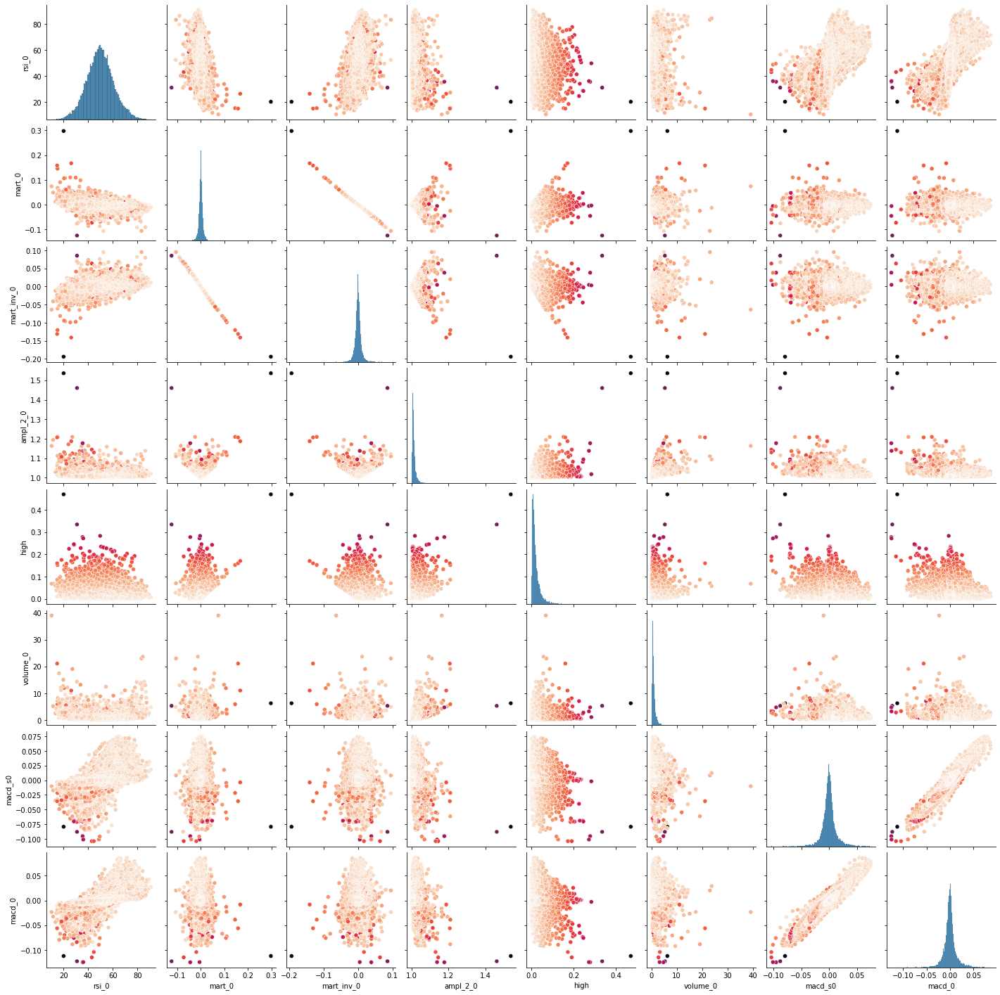

In [277]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


high = max(Σ t:0-10 (high[i - t] - high[i - 10]) / high[i - 10])


Here we can see that we have some values "high" bigger than 0.1, and that modify the colour scale, so we are going to consider them as outliers and drop "high" values bigger than 0.1

In [280]:
file_edited = file.drop(file[file["high"] > 0.1].index)

In [281]:
file_edited.describe()

,Unnamed: 0,volume_0,mart_0,mart_inv_0,ampl_2_0,rsi_0,macd_0,macd_h0,macd_s0,volume_1,...,rsi_10,macd_10,macd_h10,macd_s10,slope_prev,slope_prev_short,slope_next_short,high,low,close
count,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,...,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000,24118.000000
mean,12313.676714,1.007004,-0.000022,0.000019,1.013071,49.749969,0.000047,-0.000007,0.000055,1.008099,...,49.777747,0.000063,-0.000002,0.000065,-0.000003,0.000001,-0.000217,0.019670,-0.022917,-0.000783
std,7041.209346,1.003344,0.009487,0.009150,0.010329,10.925017,0.013743,0.004218,0.012965,1.006530,...,10.950250,0.013878,0.004235,0.013039,0.000715,0.004406,0.004103,0.017296,0.024571,0.014575
min,0.000000,0.000000,-0.106496,-0.087097,1.000000,10.364368,-0.091965,-0.030258,-0.087676,0.000000,...,10.364368,-0.124677,-0.034691,-0.103873,-0.002819,-0.038091,-0.054650,0.000000,-0.435470,-0.133301
25%,6253.250000,0.494831,-0.004319,-0.004347,1.007008,42.550746,-0.006030,-0.001813,-0.005758,0.495765,...,42.574013,-0.005991,-0.001814,-0.005714,-0.000391,-0.001818,-0.001867,0.007546,-0.028966,-0.007899
50%,12338.500000,0.727841,0.000000,0.000000,1.010260,49.617473,-0.000376,-0.000007,-0.000413,0.729047,...,49.642248,-0.000348,0.000002,-0.000402,-0.000037,-0.000048,-0.000091,0.014252,-0.015852,-0.000546
75%,18398.750000,1.166374,0.004393,0.004274,1.015680,56.605174,0.005041,0.001674,0.004760,1.165619,...,56.696430,0.005100,0.001689,0.004776,0.000329,0.001658,0.001554,0.026000,-0.008391,0.006931
max,24502.000000,39.082271,0.098781,0.095083,1.209500,90.878042,0.086336,0.044372,0.074548,38.319124,...,90.878042,0.086336,0.044372,0.074548,0.003119,0.057255,0.027085,0.099917,0.000000,0.058380


Let's plot again, in search of relations

In [282]:
file_x = [file_edited[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"volume_{x}",f"macd_s{x}",f"macd_{x}"]] for x in range(0,6)]

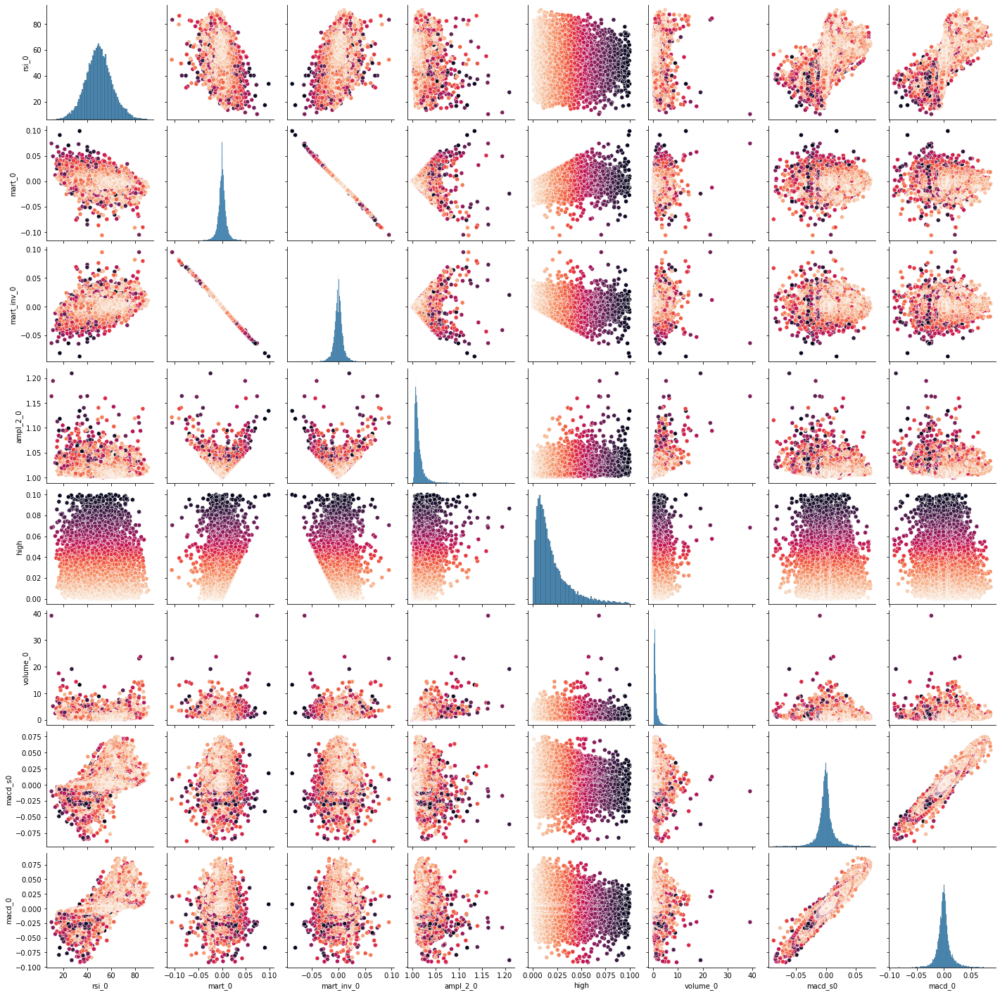

In [283]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


now will let's view fewer indicators

In [284]:
file_x = [file_edited[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"macd_s{x}"]] for x in range(0,6)]

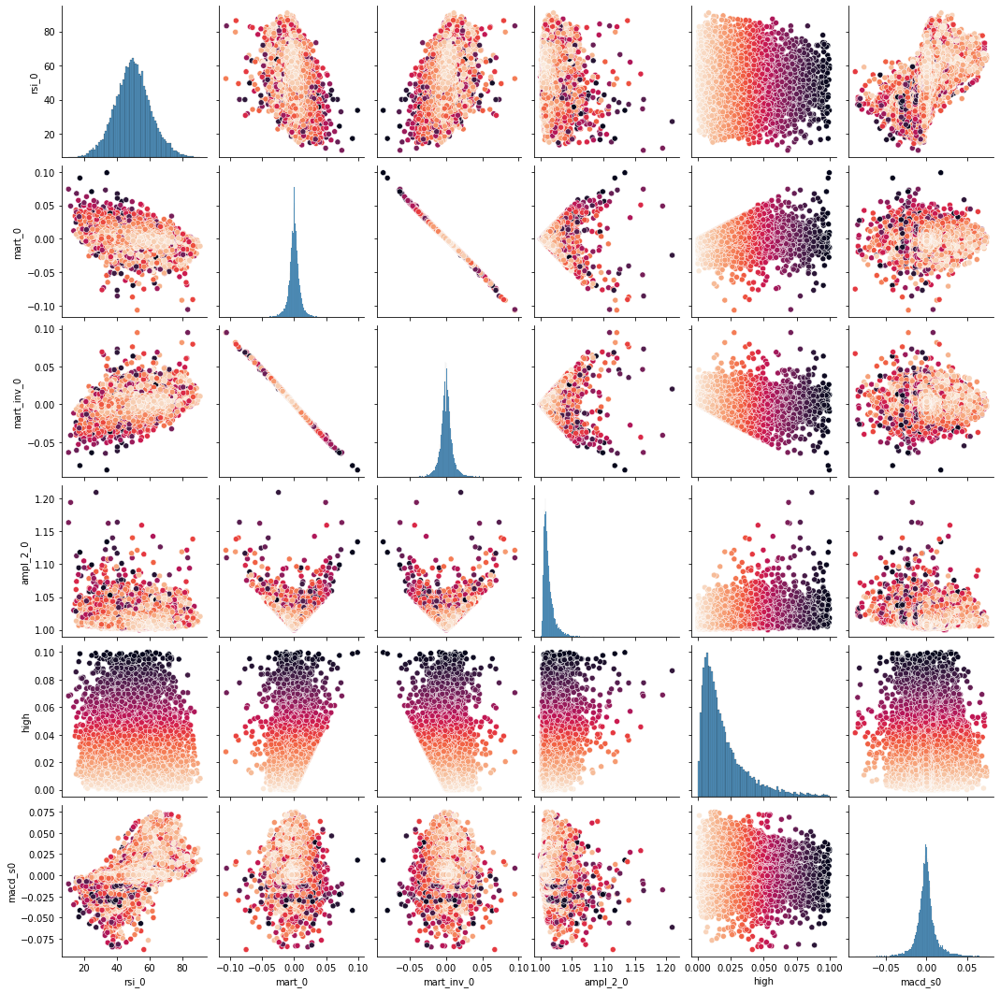

In [285]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


Now we are going to see how is the distribution without "high" values greater than 0.025


In [314]:
file_edited_0_025 = file.drop(file[file["high"] > 0.025].index)

In [317]:
file_x = [file_edited_0_025[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"macd_s{x}"]] for x in range(0,6)]

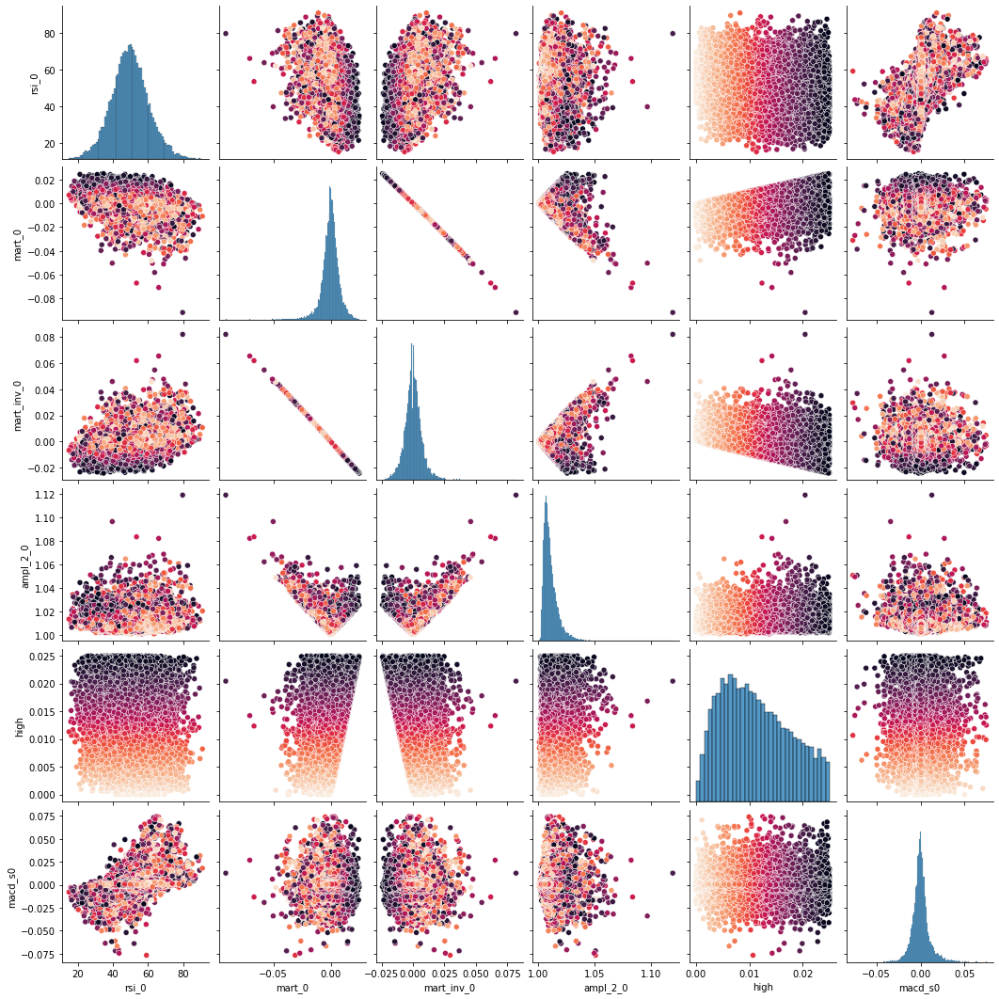

In [318]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


In [334]:
file_edited_025_ = file.drop(file[file["high"] < 0.025].index)

In [322]:
file_x = [file_edited_025_[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"macd_s{x}"]] for x in range(0,6)]


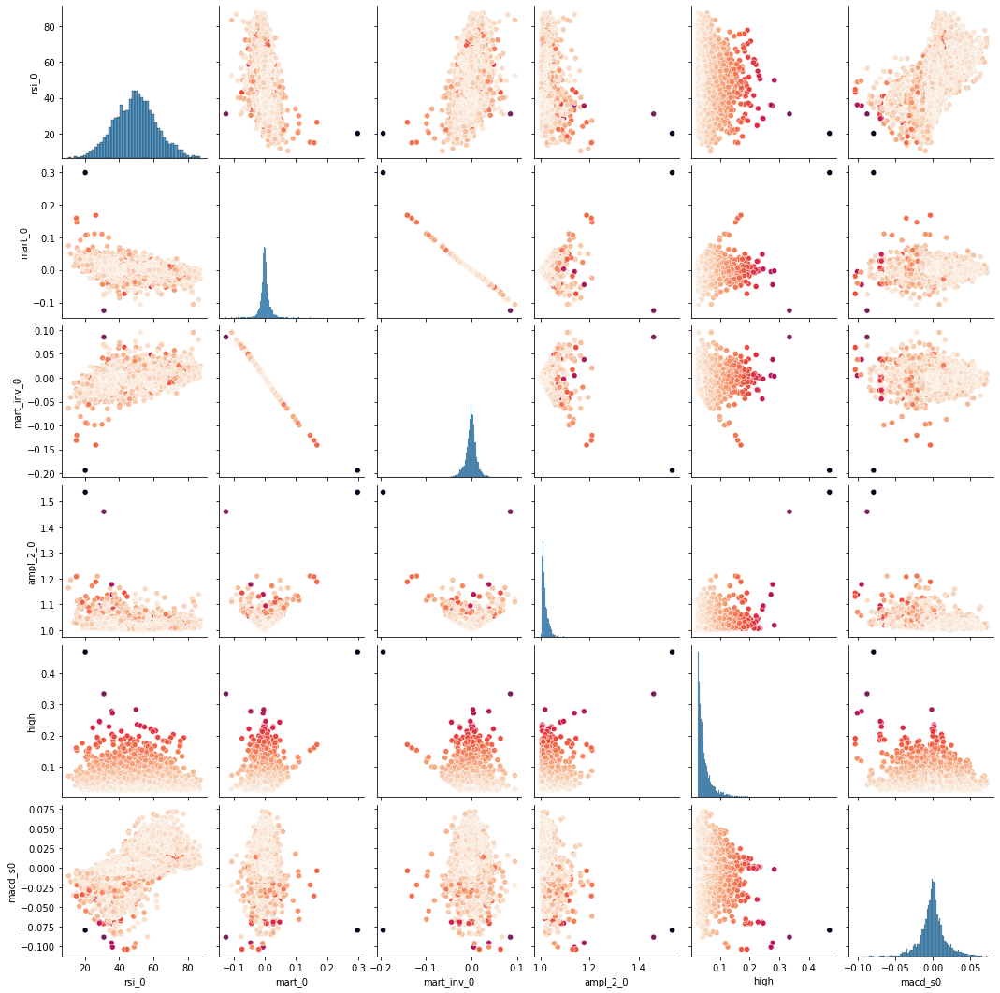

In [323]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


there are some values bigger than 0.15 to drop

In [335]:
file_edited_025_ = file_edited_025_.drop(file[file["high"] > 0.10].index)

In [336]:
file_x = [file_edited_025_[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"macd_s{x}"]] for x in range(0,6)]


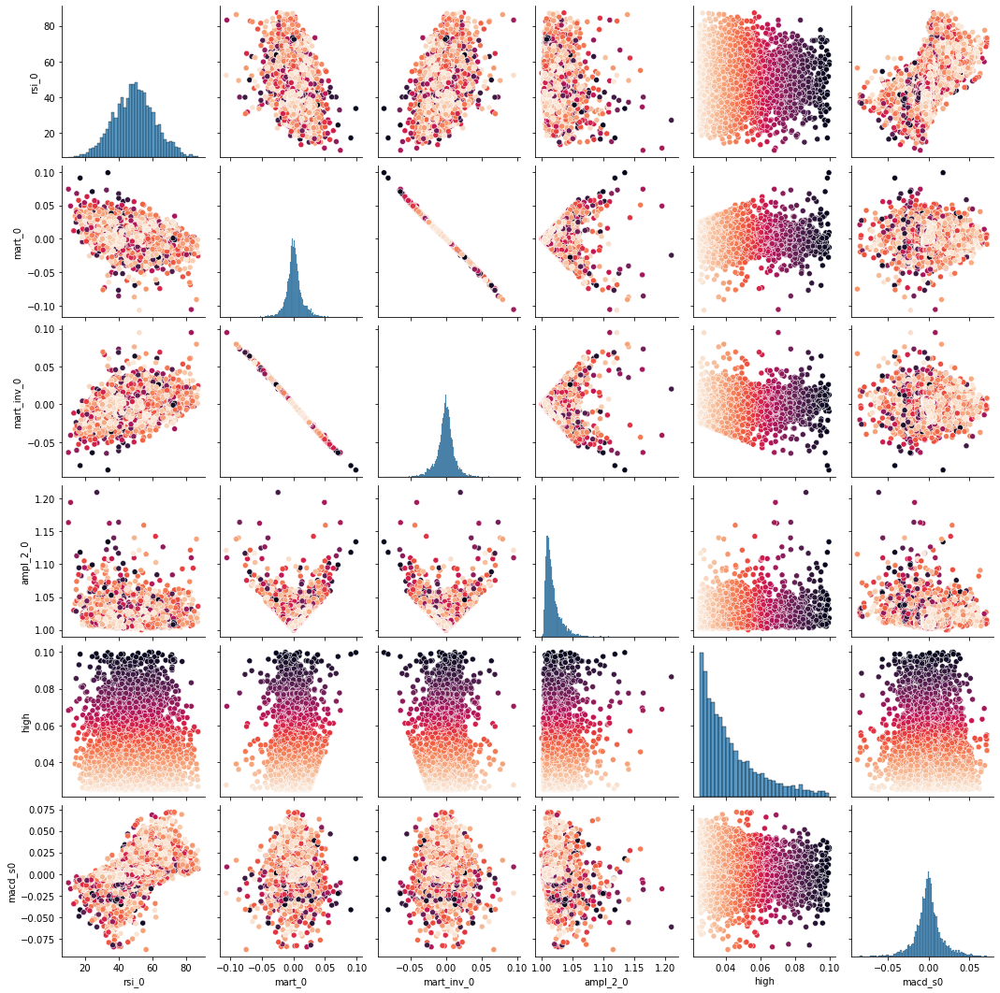

In [337]:
sns.pairplot(file_x[0],
            plot_kws=dict(
            hue = file_x[0]["high"],
            palette = "rocket_r"))


In [339]:
file_ada_btc_xmr = pd.read_csv(f"analysis/analysis_2022-07-07_09_49.csv")

In [341]:
file_ada_btc_xmr.describe()

,Unnamed: 0,volume_0,mart_0,mart_inv_0,ampl_2_0,rsi_0,macd_0,macd_h0,macd_s0,volume_1,...,rsi_5,macd_5,macd_h5,macd_s5,slope_prev,slope_prev_short,slope_next_short,high,low,close
count,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,...,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000,125680.000000
mean,62839.500000,1.022444,-0.000008,0.000014,1.010143,50.614147,1.914916,0.027131,1.887785,1.020636,...,50.613067,1.879697,0.024070,1.855627,0.259937,0.288932,0.299273,0.016500,-0.017576,0.000219
std,36280.835253,0.929197,0.008233,0.007740,0.010485,11.448061,132.681450,39.501580,125.024317,0.917747,...,11.447893,132.565031,39.498167,124.921676,7.033996,61.578052,41.649723,0.019180,0.021198,0.013136
min,0.000000,0.000000,-0.174252,-0.292138,1.000000,6.010328,-1958.764639,-567.743831,-1748.774165,0.000000,...,6.010328,-1958.764639,-567.743831,-1748.774165,-44.761421,-1567.134000,-799.020909,0.000000,-0.583784,-0.168597
25%,31419.750000,0.534693,-0.002973,-0.002789,1.004688,43.313690,-4.425078,-2.100697,-4.166201,0.535316,...,43.312973,-4.425829,-2.100697,-4.168799,-0.288450,-2.429000,-1.505500,0.005440,-0.021780,-0.004894
50%,62839.500000,0.777166,-0.000040,0.000039,1.007578,50.610481,0.002121,0.000101,0.002067,0.777403,...,50.609584,0.002120,0.000101,0.002067,0.000194,0.000500,0.000473,0.010843,-0.011247,0.000194
75%,94259.250000,1.182423,0.002811,0.002951,1.012271,57.837735,8.755124,2.106645,8.463477,1.181953,...,57.836519,8.748716,2.106158,8.455937,0.767307,3.227250,2.207833,0.020745,-0.005680,0.005348
max,125679.000000,38.764945,0.607025,0.137632,2.077873,97.791673,1372.430567,504.052103,1236.465932,37.997000,...,97.791673,1372.430567,504.052103,1236.465932,39.746793,1469.907000,635.365636,0.649852,0.000000,0.253047


In [342]:
file_ada_btc_xmr_x = [file_ada_btc_xmr[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high",f"volume_{x}",f"macd_s{x}",f"macd_{x}"]] for x in range(0,6)]


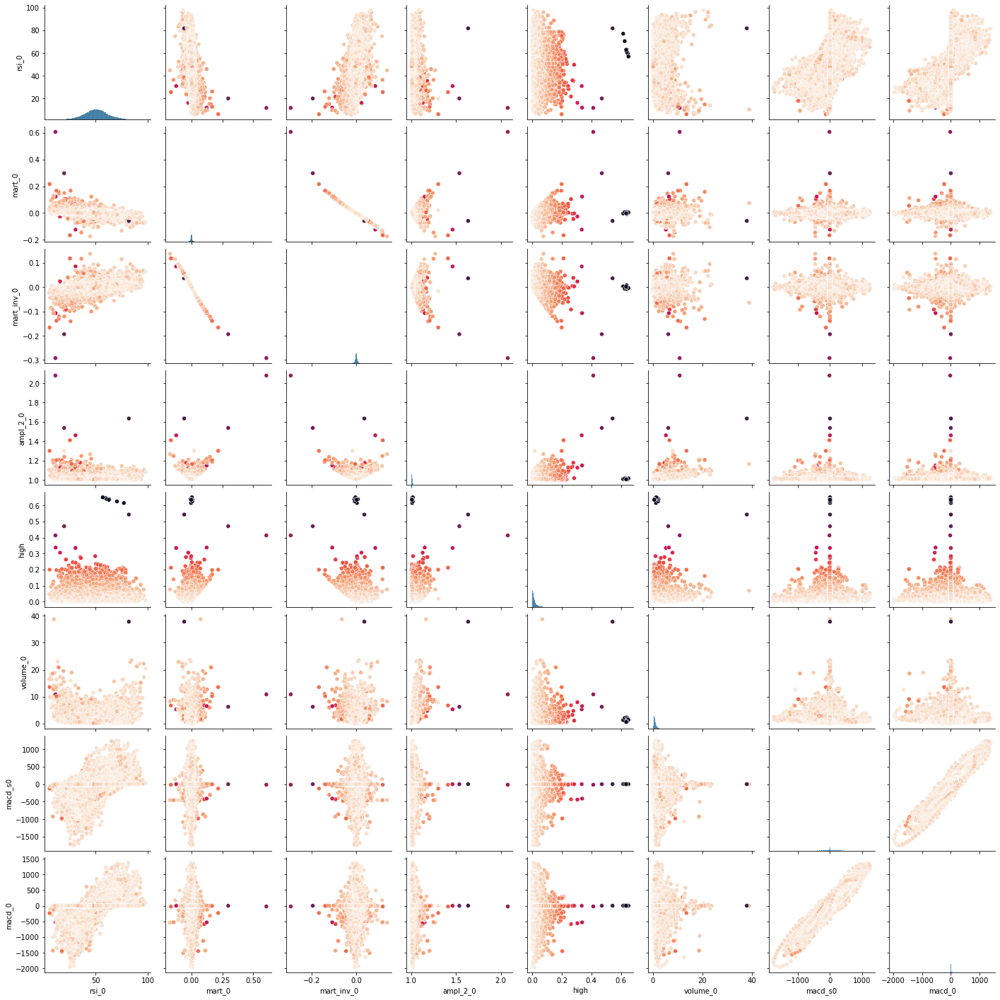

In [343]:
sns.pairplot(file_ada_btc_xmr_x[0],
            plot_kws=dict(
            hue = file_ada_btc_xmr_x[0]["high"],
            palette = "rocket_r"))


In [355]:
file_ada_btc_xmr_10_ = file_ada_btc_xmr.drop(file_ada_btc_xmr[file_ada_btc_xmr["high"] > 0.05].index)

In [356]:
file_ada_btc_xmr_x = [file_ada_btc_xmr_10_[[f"rsi_{x}",f"mart_{x}",f"mart_inv_{x}",f"ampl_2_{x}","high","low",f"volume_{x}",f"macd_s{x}",f"macd_{x}"]] for x in range(0,6)]


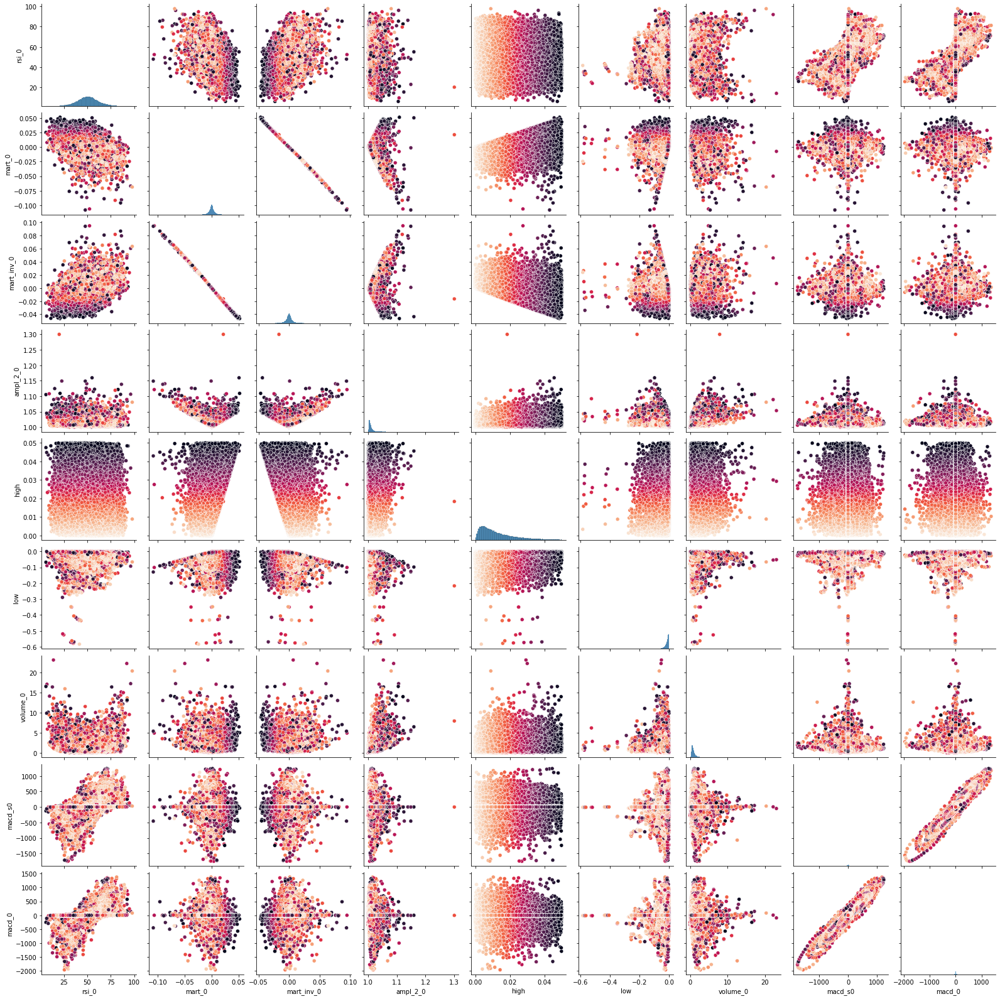

In [357]:
sns.pairplot(file_ada_btc_xmr_x[0],
            plot_kws=dict(
            hue = file_ada_btc_xmr_x[0]["high"],
            palette = "rocket_r"))

In [ ]:
file_ada_btc_xmr_10_ = file_ada_btc_xmr.drop(file[file["mart_0"] > 0.10].index)